In [1]:
# imports
import numpy as np
import matplotlib.pyplot as plt
import gaiamock # note: will only work if executed in the same directory as 'gaiamock.py'
import emcee
import corner

# read in the compiled C functions
c_funcs = gaiamock.read_in_C_functions()

In [2]:
# plotting style (optional!)
import matplotlib as mpl
from matplotlib import rc
mpl.style.use('classic')
mpl.rcParams['text.usetex'] = True
mpl.rcParams['text.latex.preamble'] = r'\usepackage{mlmodern}'

mpl.rc('xtick', labelsize=27) 
mpl.rc('ytick', labelsize=27)
mpl.rc('xtick', labelsize=27) 
mpl.rc('ytick', labelsize=27)

mpl.rcParams['xtick.major.size'] = 10.0
mpl.rcParams['xtick.major.width'] = 1.75
mpl.rcParams['ytick.major.size'] = 10.0
mpl.rcParams['ytick.major.width'] = 1.75

mpl.rcParams['axes.linewidth'] = 2.0
mpl.rcParams['patch.linewidth'] = 2.0
mpl.rcParams['xtick.major.pad'] = 10.0
mpl.rcParams['ytick.major.pad'] = 10.0

mpl.rcParams['xtick.top'] = False
mpl.rcParams['ytick.right'] = False

mpl.rcParams['xtick.minor.size'] = 5.0
mpl.rcParams['xtick.minor.width'] = 1.75
mpl.rcParams['ytick.minor.size'] = 5.0
mpl.rcParams['ytick.minor.width'] = 1.75

mpl.rcParams['ytick.right'] = True
mpl.rcParams['xtick.top'] = True

import os
os.environ["PATH"] += os.pathsep + '/Library/TeX/texbin'

In [3]:
# function to calculate absolute G-band magnitude from stellar mass
def calc_absGmag(mass, coeff=np.array([16.91206805,  24.95258266,   4.0433877 , -13.63108438, 4.77092427])):
    return np.polyval(coeff, np.log10(mass))

In [4]:
# simple model for Gaia's astrometric uncertainty
def piecewise(x, a):
    return a*np.max([1.0*np.ones(len(x)), 10**(0.2*(x - 14.0))], axis=0)

In [5]:
# function to get planet mass by solving the relevant cubic (see Appendix A of paper)
def get_planet_mass(alpha, period, stellar_mass):
    # common factor
    C = (alpha**3)/(period**2)

    # cubic coefficients: x^3 + a x^2 + b x + c = 0
    a = -C
    b = -2*C*stellar_mass
    c = -C*(stellar_mass**2)

    # depressed‐cubic parameters
    p = b - (a*a)/3.0
    q = (2.0*a*a*a)/27.0 - (a*b)/3.0 + c

    # discriminant
    D = (q*0.5)**2 + (p/3.0)**3

    # Cardano’s formula for the single real root
    sqrt_D = np.sqrt(D)
    u = np.cbrt(-q*0.5 + sqrt_D)
    v = np.cbrt(-q*0.5 - sqrt_D)
    y = u + v

    # substitute back in
    x = y - a/3.0

    return x

In [6]:
# convenience function for plotting: format strings properly
def format_stats(arr, nd=1):
    q16, q50, q84 = np.percentile(arr, [15.87, 50.0, 84.14])
    lo = q50 - q16
    hi = q84 - q50
    return rf"${q50:.{nd}f}^{{+{hi:.{nd}f}}}_{{-{lo:.{nd}f}}}$"

In [7]:
# fix random seed
np.random.seed(3)

# Generate simulated astrometry and perform non-linear fit

In [8]:
# choose parameters
dist = 100 # pc
parallax = 1000/dist # mas
M_star = 0.8 # solar masses
m_p = 8.0*1/1047.57 # solar masses
semi_a_planet = 4.0 # AU
period = 365.25*(semi_a_planet**(1.5))/(M_star**0.5) # days
Tp, ecc = 500, 0.2 # days, unitless
omega, w = 110.0*(np.pi/180.0), 50.0*(np.pi/180.0) # deg
inc = 60.0*(np.pi/180.0) # deg

# calculated parameters
phi_p = Tp*(2*np.pi/period)
phot_g_mean_mag = calc_absGmag(M_star) + 5.0*np.log10(dist) - 5.0
print('phot_g_mean_mag:', phot_g_mean_mag)

# totally arbitrary
ra, dec = 25.0, -13.0
pmra, pmdec = 12.0, 30.0

phot_g_mean_mag: 11.108667953805075


In [9]:
# simulate astrometry
t_ast_yr, psi, plx_factor, ast_obs, ast_err = gaiamock.predict_astrometry_luminous_binary(ra=ra, dec=dec, parallax=parallax, 
                        pmra=pmra, pmdec=pmdec, m1=M_star, m2=m_p, period=period, Tp=Tp, ecc=ecc, 
                        omega=omega, inc=inc, w=w, phot_g_mean_mag=phot_g_mean_mag, f=0.0, data_release = 'dr5',
                        c_funcs = c_funcs)

# get the linear parameters 
chi2, mu_linear = gaiamock.get_astrometric_chi2(t_ast_yr = t_ast_yr, psi = psi, plx_factor = plx_factor, 
        ast_obs = ast_obs, ast_err = ast_err, P = period, phi_p = phi_p, ecc = ecc, c_funcs=c_funcs)
ra_off, pmra, dec_off, pmdec, plx, B, G, A, F = mu_linear

In [10]:
# get no-planet solution
Cinv = np.diag(1/ast_err**2)
M = np.vstack([np.sin(psi), t_ast_yr*np.sin(psi), np.cos(psi), t_ast_yr*np.cos(psi), plx_factor]).T
mu = np.linalg.solve(M.T @ Cinv @ M, M.T @ Cinv @ ast_obs) #  ra, pmra, dec, pmdec, parallax
no_pl_Lambda_pred = np.dot(M, mu)
no_pl_chi2s = np.sum((ast_obs - no_pl_Lambda_pred)**2/ast_err**2)
print('no_pl_chi2s:', no_pl_chi2s)

no_pl_chi2s: 2287.504712369301


In [11]:
# fit for non-linear astrometric parameters (P, phi_p, ecc)
theta_array = gaiamock.fit_orbital_solution_nonlinear(t_ast_yr=t_ast_yr, psi=psi, plx_factor=plx_factor, ast_obs=ast_obs, ast_err=ast_err, c_funcs=c_funcs)

In [12]:
# solve for linear parameters
one_pl_chi2, mu_linear = gaiamock.get_astrometric_chi2(t_ast_yr=t_ast_yr, psi=psi, plx_factor=plx_factor, ast_obs=ast_obs, ast_err=ast_err, P=theta_array[0], phi_p=theta_array[1], ecc=theta_array[2], c_funcs=c_funcs)
fit_ra_off, fit_pmra, fit_dec_off, fit_pmdec, fit_plx, fit_B, fit_G, fit_A, fit_F = mu_linear
fit_a0, fit_Omega, fit_w, fit_inc = gaiamock.get_Campbell_elements(fit_A, fit_B, fit_F, fit_G)
fit_P, fit_phi_p, fit_ecc = theta_array
fit_Tp = fit_P*fit_phi_p/(2*np.pi)
fit_mp = get_planet_mass(fit_a0/fit_plx, fit_P/365.25, 0.8)
print('one_pl_chi2:', one_pl_chi2)

one_pl_chi2: 279.52592834939077


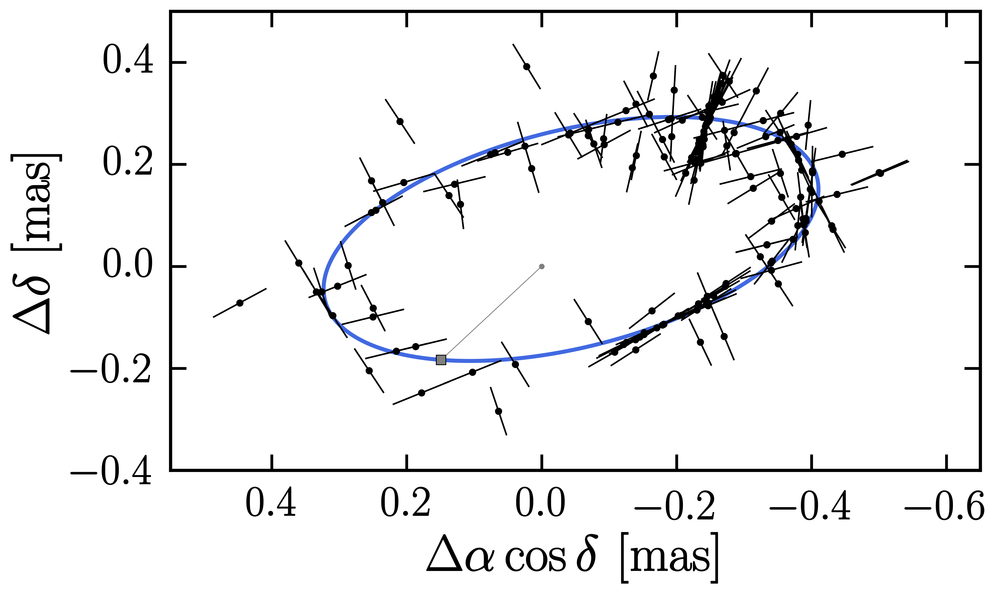

In [13]:
# make plot; add orbit on sky
x_periastron, y_periastron = gaiamock.photocenter_orbit_2d_from_thiele_innes(t_ast_yr = np.array([fit_Tp/365.25]), parallax=fit_plx, period=fit_P, Tp=fit_Tp, ecc=fit_ecc, A=fit_A, B=fit_B, F=fit_F, G=fit_G, c_funcs=c_funcs)
fig = plt.figure(figsize=(9.1, 5.0), dpi=600, facecolor='white')
ax = fig.add_subplot(111)
ax.plot([0, x_periastron[0]], [0, y_periastron[0]], marker='.', ls='-', lw=0.5, color='0.5')
ax.plot(x_periastron, y_periastron, marker='s', color='0.5', mfc='0.5', zorder=10)

# add epoch-level measurements
t_grid = np.linspace(np.min(t_ast_yr), np.min(t_ast_yr) + period/365.25, 1000)
x_curve, y_curve = gaiamock.photocenter_orbit_2d_from_thiele_innes(t_ast_yr=t_grid, parallax=fit_plx, period=fit_P, Tp=fit_Tp, ecc=fit_ecc, A=fit_A, B=fit_B, F=fit_F, G=fit_G, c_funcs=c_funcs)
ax.plot(x_curve, y_curve, ls='-', lw=2.5, color='royalblue')
x_epoch, y_epoch = gaiamock.photocenter_orbit_2d_from_thiele_innes(t_ast_yr = t_ast_yr, parallax = parallax, period = period, Tp=Tp, ecc = ecc, A=A, B=B, F=F, G=G, c_funcs = c_funcs)
orbit_exact = x_epoch*np.sin(psi) + y_epoch*np.cos(psi)
Lambda_com = (ra_off + pmra*t_ast_yr)*np.sin(psi) + (dec_off + pmdec*t_ast_yr)*np.cos(psi) + parallax*plx_factor
residuals = ast_obs - (orbit_exact + Lambda_com)
residual_ra, residual_dec = np.sin(psi)*residuals, np.cos(psi)*residuals
ax.plot(x_epoch + residual_ra, y_epoch + residual_dec, marker='o', color='k', ms=4, mfc='k', mec='k', ls='')

# add epoch-level error-bars
for jj in range(len(residuals)):
    x1 = x_epoch[jj] + np.sin(psi)[jj] * (residuals[jj] + ast_err[jj])
    x2 = x_epoch[jj] + np.sin(psi)[jj] * (residuals[jj] - ast_err[jj])
    y1 = y_epoch[jj] + np.cos(psi)[jj] * (residuals[jj] + ast_err[jj])
    y2 = y_epoch[jj] + np.cos(psi)[jj] * (residuals[jj] - ast_err[jj])
    ax.plot([x1, x2], [y1, y2], 'k-', lw=1)
    
ax.set_xlabel(r'$\rm \Delta\alpha\cos\delta \,\,[mas]$', fontsize=32)
ax.set_ylabel(r'$\rm \Delta\delta\,\,[mas]$', fontsize=32)
ax.set_xlim([0.55, -0.65])
ax.set_ylim([-0.4, 0.5])
plt.yticks([-0.4, -0.2, 0.0, 0.2, 0.4])
plt.show()

In [14]:
# get residuals for one-companion (12-parameter) fit
one_pl_Lambda_pred = gaiamock.get_residuals_12par_solution(t_ast_yr=t_ast_yr, psi=psi, plx_factor=plx_factor, ast_obs=ast_obs,
                                           ast_err=ast_err, theta_array=theta_array, c_funcs=c_funcs)

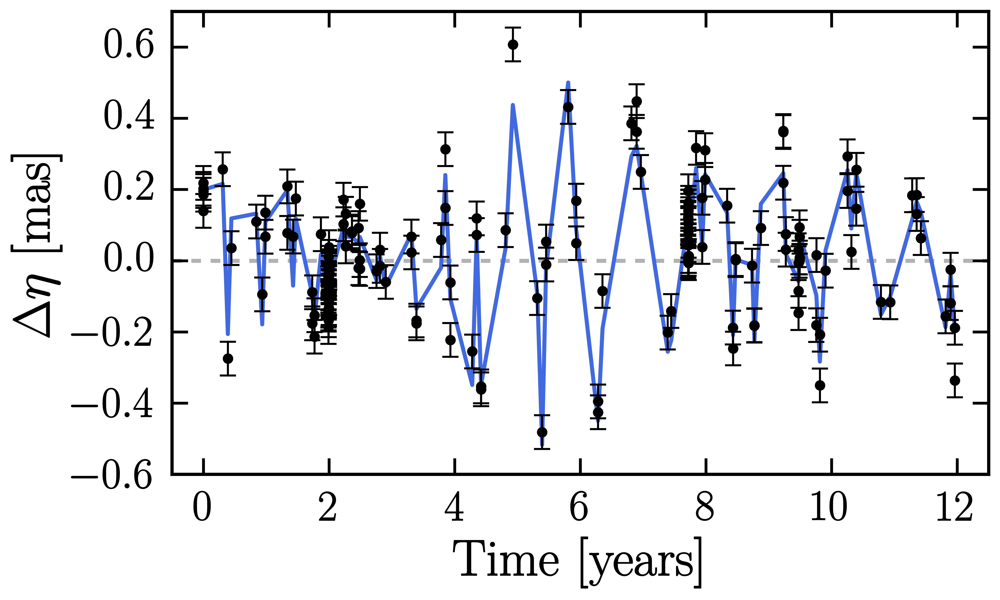

In [15]:
# make plot of along-scan angle versus time
fig = plt.figure(figsize=(9.1, 5.0), dpi=600, facecolor='white')
ax = fig.add_subplot(111)
ax.axhline(y=0.0, c='k', alpha=0.3, ls='--', lw=2.5, zorder=-10)
ax.errorbar(t_ast_yr - t_ast_yr[0], ast_obs - no_pl_Lambda_pred, ast_err, fmt='o', color='k', ms=6.0, lw=1.25, capsize=5, capthick=1.25, zorder=10)
plt.plot(t_ast_yr - t_ast_yr[0], one_pl_Lambda_pred - no_pl_Lambda_pred, ls='-', lw=2.5, color='royalblue', label='$\mathrm{Planet~model}$')
ax.set_xlabel(r'$\mathrm{Time~[years]}$', fontsize=32)
ax.set_ylabel(r'$\Delta \eta~\mathrm{[mas]}$', fontsize=32)
ax.set_xlim([-0.5, 12.5])
ax.set_ylim([-0.6, 0.7])
plt.show()

# Carry out MCMC analysis and make corner plot

In [16]:
# MCMC function: fit orbit and calculate log probability (if parameters are physical) 
def log_probability(theta, t_ast_yr, psi, plx_factor, ast_obs, ast_err):
    lp = log_prior(theta)
    if not np.isfinite(lp):
        return -np.inf

    # convert dist to parallax
    theta_copy = np.copy(theta)
    theta_copy[2] = 1000.0/theta[2]

    resids_norm = gaiamock.get_astrometric_residuals_12par(t_ast_yr=t_ast_yr, psi=psi, plx_factor=plx_factor, ast_obs=ast_obs, ast_err=ast_err, theta_array=theta_copy, c_funcs=c_funcs)
    log_prob = lp + -0.5*np.sum(resids_norm**2)

    if np.isnan(log_prob):
        return -np.inf

    return log_prob

In [17]:
# MCMC function: uniform prior on physically plausible values
def log_prior(theta):
    ra_off, dec_off, dist, pmra, pmdec, period, ecc, phi_p, A, B, F, G = theta

    if not (0.0 < period):
        return -np.inf

    if not (0.0 < dist):
        return -np.inf

    if not (0.0 < ecc < 1.0):
        return -np.inf

    if not (0.0 < phi_p < 2*np.pi):
        return -np.inf

    return 0.0

In [18]:
# MCMC function: add a small amount of noise to the best-fit parameters (makes walkers independent)
def get_rand_p0(best_fit, nwalkers):
    p0_arr = best_fit + np.zeros((nwalkers, len(best_fit))) # many copies of best_fit
    p0_arr[:,0] = p0_arr[:,0] + 1e-3*np.random.randn(nwalkers) # ra_off
    p0_arr[:,1] = p0_arr[:,1] + 1e-3*np.random.randn(nwalkers) # dec_off
    p0_arr[:,2] = p0_arr[:,2] + 1e-3*np.random.randn(nwalkers) # dist
    p0_arr[:,3] = p0_arr[:,3] + 1e-3*np.random.randn(nwalkers) # pmra
    p0_arr[:,4] = p0_arr[:,4] + 1e-3*np.random.randn(nwalkers) # pmdec
    p0_arr[:,5] = p0_arr[:,5] + 1e-3*np.random.randn(nwalkers) # period
    p0_arr[:,6] = p0_arr[:,6] + 1e-3*np.random.randn(nwalkers) # ecc
    p0_arr[:,7] = p0_arr[:,7] + 1e-3*np.random.randn(nwalkers) # phi_p
    p0_arr[:,8] = p0_arr[:,8] + 1e-3*np.random.randn(nwalkers) # A
    p0_arr[:,9] = p0_arr[:,9] + 1e-3*np.random.randn(nwalkers) # B
    p0_arr[:,10] = p0_arr[:,10] + 1e-3*np.random.randn(nwalkers) # F
    p0_arr[:,11] = p0_arr[:,11] + 1e-3*np.random.randn(nwalkers) # G

    return p0_arr

In [19]:
# collect best-fit parameters
theta_array = gaiamock.fit_orbital_solution_nonlinear(t_ast_yr=t_ast_yr, psi=psi, plx_factor=plx_factor, ast_obs=ast_obs, ast_err=ast_err, c_funcs=c_funcs)
chi2, mu_linear = gaiamock.get_astrometric_chi2(t_ast_yr=t_ast_yr, psi=psi, plx_factor=plx_factor, ast_obs=ast_obs, ast_err=ast_err, P=theta_array[0], phi_p=theta_array[1], ecc=theta_array[2], c_funcs=c_funcs)
ra_off, pmra, dec_off, pmdec, plx, B, G, A, F = mu_linear
best_fit = np.array([ra_off, dec_off, 1000/plx, pmra, pmdec, theta_array[0], theta_array[2], theta_array[1], A, B, F, G])

In [20]:
# calculate factor by which error bars have been underestimated (expected for bright stars)
unc_factor = np.sqrt(chi2/(len(ast_obs) - 12))
unc_factor

1.3385936179567528

In [21]:
p0 = get_rand_p0(best_fit, 100) # get initial guesses
sampler = emcee.EnsembleSampler(100, 12, log_probability, args=(t_ast_yr, psi, plx_factor, ast_obs, unc_factor*ast_err))

In [22]:
# run MCMC analysis
samples = sampler.run_mcmc(p0, 10_000, progress=True)

100%|████████████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.47it/s]


In [23]:
# get autocorrelation time (< 1/25th length of chain)
chain = sampler.chain
tau = emcee.autocorr.integrated_time(chain.transpose((1, 0, 2)), tol=0)
10_000/np.max(tau)

26.78632471518178

In [24]:
# discard burn-in
corner_chain = chain[:, 5000:, :].reshape((-1, 12))
len(corner_chain)

500000

In [25]:
# calculate planet mass
plx_vals = 1000/corner_chain[:,2]
Porb = corner_chain[:,5]
A_vals, B_vals, F_vals, G_vals = corner_chain[:,8], corner_chain[:,9], corner_chain[:,10], corner_chain[:,11]
a0, Omega, w, inc = gaiamock.get_Campbell_elements(A_vals, B_vals, F_vals, G_vals)
mass_pl = np.array([get_planet_mass(a0[k]/plx_vals[k], Porb[k]/365.25, M_star) for k in range(len(a0))])

In [26]:
# restrict to parameters of interest, fix units, etc.
inds = [2, 3, 4, 5, 6, 7, 8, 9, 10]
plot_chain = chain[:, 5000:, np.array(inds)].reshape((-1, 9)) #discard burn-in
plot_chain[:,3] = Porb/365.25
plot_chain[:,5] = mass_pl*1047.57
plot_chain[:,6] = inc*(180.0/np.pi)
plot_chain[:,7] = w*(180.0/np.pi)
plot_chain[:,8] = Omega*(180.0/np.pi)

In [27]:
# solve for linear parameters
one_pl_chi2, mu_linear = gaiamock.get_astrometric_chi2(t_ast_yr=t_ast_yr, psi=psi, plx_factor=plx_factor, ast_obs=ast_obs, ast_err=ast_err, P=theta_array[0], phi_p=theta_array[1], ecc=theta_array[2], c_funcs=c_funcs)
fit_ra_off, fit_pmra, fit_dec_off, fit_pmdec, fit_plx, fit_B, fit_G, fit_A, fit_F = mu_linear
fit_a0, fit_Omega, fit_w, fit_inc = gaiamock.get_Campbell_elements(fit_A, fit_B, fit_F, fit_G)
fit_P, fit_phi_p, fit_ecc = theta_array
fit_Tp = fit_P*fit_phi_p/(2*np.pi)
print('one_pl_chi2:', one_pl_chi2)

one_pl_chi2: 279.52592834938963


In [28]:
# true values, labels, and units for the plot
true_values = np.array([100.0, 12.0, 30.0, 8.944, 0.2, 8.0, 60.0, 50.0, 110.0])
bestfit_values = np.array([1000/fit_plx, fit_pmra, fit_pmdec, fit_P/365.25, fit_ecc, fit_mp, fit_inc*(180.0/np.pi), fit_w*(180.0/np.pi), fit_Omega*(180.0/np.pi)])
labels = [r'$r~\mathrm{[pc]}$', r'$\mu_\alpha~\mathrm{[mas/yr]}$', r'$\mu_\delta~\mathrm{[mas/yr]}$', r'$P_\mathrm{orb}~\mathrm{[yr]}$', r'$e$', r'$m_p~[M_\mathrm{J}]$', r'$i~\mathrm{[deg]}$', r'$\omega~\mathrm{[deg]}$', r'$\Omega~\mathrm{[deg]}$']
title_labels = [r'$r$', r'$\mu_\alpha$', r'$\mu_\delta$', r'$P_\mathrm{orb}$', r'$e$', r'$m_p$', r'$i$', r'$\omega$', r'$\Omega$']
title_units = [r'$\mathrm{pc}$', r'$\mathrm{mas/yr}$', r'$\mathrm{mas/yr}$', r'$\mathrm{yr}$', r'', r'$M\mathrm{_J}$', r'$\mathrm{deg}$', r'$\mathrm{deg}$', r'$\mathrm{deg}$']

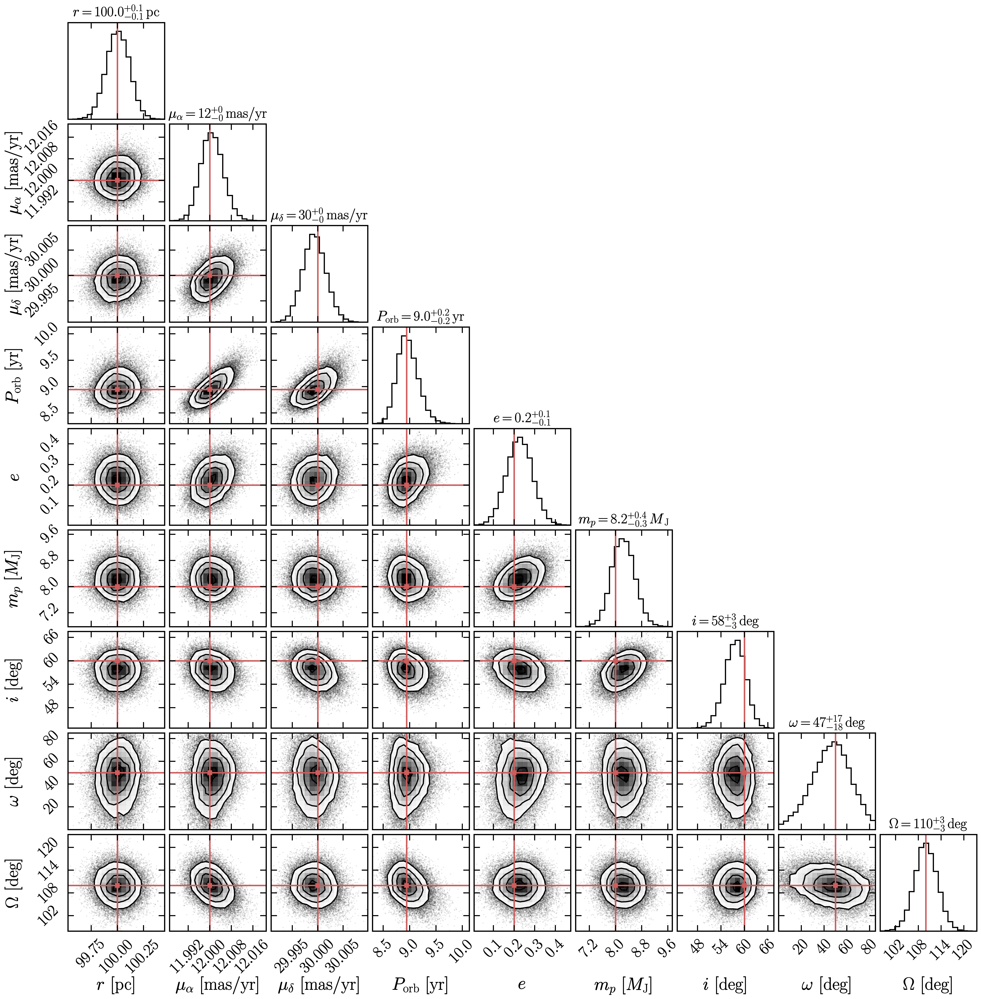

In [29]:
# make plot
default = 0.99999 # choose x and y ranges automatically
fig = plt.figure(figsize=(23,23), facecolor='white', dpi=250)
corner.corner(plot_chain[::10], labels=labels, fig=fig, label_kwargs = {"fontsize": 30}, labelpad=0.17, contour_kwargs={"linewidths": 2.0},
              range=[default, default, default, default, default, default, default, (0.0, 85.0), default], plot_datapoints=True)

# highlight the true values on the interior plots
axes = np.array(fig.axes).reshape((9, 9))
for yi in range(9):
    for xi in range(yi):
        ax = axes[yi, xi]
        ax.axvline(true_values[xi], color="indianred", lw=2.5)
        ax.axhline(true_values[yi], color="indianred", lw=2.5)
        ax.plot(true_values[xi], true_values[yi], marker="s", ms=8, mew=0.0, color="indianred")
        
# highlight the true values on the diagonal plots
for i in range(9):
    ax = axes[i, i]
    ax.axvline(true_values[i], color="indianred", lw=2.5)
    
# report constraints on top of diagonal plots
for i in range(9):
    if i in [1, 2, 6, 7, 8]:
        num_decimal_places = 0
    else:
        num_decimal_places = 1
        
    ax = axes[i, i]
    ax.set_title(title_labels[i] + '$\,{=}\,$' + format_stats(plot_chain[:, i], num_decimal_places) + '$\,$' + title_units[i],
                 fontsize=24,
                 pad=12, loc="center")

# fix tick formatting
axes = fig.get_axes()
for ax in axes:
    ax.yaxis.set_major_formatter(mpl.ticker.ScalarFormatter(useOffset=False))
    ax.xaxis.set_major_formatter(mpl.ticker.ScalarFormatter(useOffset=False))

num_vars = len(labels)
for i, ax in enumerate(axes):
    row, col = divmod(i, num_vars)
    if col != 0: # only show y-tick labels for the left-most panels
        ax.yaxis.set_ticklabels([])
    if row != num_vars - 1: # only show x-tick labels for the bottom-most panels
        ax.xaxis.set_ticklabels([])
        
plt.show()